### 💼 **Business Problem**
Educational institutions are under increasing pressure to demonstrate strong placement outcomes for both current students and alumni. However, the job market is highly dynamic: roles, required skills, experience levels, locations, and salary ranges change daily. Manually tracking thousands of job postings across platforms like Naukri.com is impractical, slow, and prone to missing relevant opportunities.

As a result, students and alumni often struggle to identify roles that truly match their qualifications, skills, career goals, and experience levels. Career services teams face similar challenges in providing timely, personalized job recommendations and in understanding market demand to align academic programs with industry needs.

The institution needs a data-driven system that can automatically collect job postings from Naukri.com, structure and analyze them, and match them against student and alumni profiles. The objective is to:

Identify the most suitable job opportunities for each student and alumnus based on skills, education, experience, and preferences.

Provide real-time or near–real-time job recommendations.

Generate insights on in-demand skills, roles, industries, and salary trends.

Help academic leadership adjust curriculum and training programs based on market demand.

Without such a system, the institution risks lower placement rates, reduced student satisfaction, weaker alumni outcomes, and misalignment between academic offerings and industry requirements.

---

### 🎯 **Business understanding**
The education institute aims to improve placement outcomes for its students and alumni by using data-driven job matching. Naukri.com contains a large volume of up-to-date job postings across industries, roles, locations, and experience levels, making it a valuable source of labor market intelligence.
The business value includes:

1. Higher placement and employability rates
2. Better student satisfaction and institutional reputation
3. Stronger industry alignment
4. Data-backed curriculum and training decisions

---
### ⚠️ **Constraints**

1. Scraped data can be used only for internal academic and placement purposes.
2. Budget is limited for tools, servers, and technical manpower.
3. Project must show results before the placement season.
4. High dependence on external website (Naukri.com) for data availability.
5. Changes in website structure can disrupt data collection.
6. Anti-scraping mechanisms may limit data access.
7. Data quality issues such as duplicates, missing fields, and inconsistent formats.
8. System must be easy for students and placement teams to use.
9. Need to protect student and alumni data privacy.
10. Must follow institutional and legal data security guidelines.

## Importing All the required libraries

In [1]:
!pip install selenium
!pip install webdriver_manager

In [51]:
from selenium import webdriver # importing webdrivers from selenium
from selenium.webdriver.chrome.service import Service # to use service from chrome browser
from selenium.webdriver.chrome.options import Options # to use funstionality like fit ti window or block notifications
from selenium.webdriver.common.by import By # accessed elements in the tag name 
from selenium.webdriver.common.keys import Keys # key is used to naviagte in the page or access the javascript content in the website
from webdriver_manager.chrome import ChromeDriverManager # install driver manager to connect with the browser (avoid version mismatch)
import time # introduce time to load the website
import re
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC

In [7]:
option=Options()
option.add_argument('--start-maximized') # headless
# service
service=Service(ChromeDriverManager().install()) # creating the option and service that will be used to install the chrome

In [8]:
driver=webdriver.Chrome(service=service, options=option) # adding the option and service created to install the chrome.

In [5]:
driver.get('https://www.google.com') #introducing the search engine/browser in the installed chrome

In [6]:
search_box=driver.find_element(By.XPATH,'//*[@id="APjFqb"]') # accessing the searc box using the double inspect and pasting the xpath in the find_element
search_box.send_keys('Naukri.com') 

In [7]:
search_box.send_keys(Keys.RETURN) # Pressing enter

In [273]:
#a=driver.find_element(By.XPATH, '//*[@id="tsuid_KqJwaZXSMOewwcsP-_WEkQk_33"]/div/div[2]/div/div/div/div/div/div/div[1]/a/div[1]/span')
#a.click()

In [3]:
url="https://www.naukri.com/mnjuser/homepage"

In [9]:
driver.get(url)

In [10]:
nsearch=driver.find_element(By.XPATH, '//*[@id="ni-gnb-searchbar"]/div/div[2]/div/div/div/input')
nsearch.send_keys('Data Analyst, Data Scientist')

In [11]:
nsearch.send_keys(Keys.RETURN) # Pressing enter

In [12]:
city=driver.find_element(By.XPATH, '//*[@id="search-result-container"]/div[1]/div[1]/div/div/div[2]/div[4]/div[2]/div[1]/label/i') #selecting the city filter
city.click()

In [13]:
data=driver.find_elements(By.CSS_SELECTOR, '.row1')[0].text #testing if we are able to extract the job titles
data

'Service Advisor'

In [14]:
title=[]
for i in driver.find_elements(By.CSS_SELECTOR, '.row1'):
    ttl=i.text
    title.append(ttl)
title

['Service Advisor',
 'Data Scientist (US Value & Access Insights)',
 'Data Analyst / Data Scientist',
 'Data Scientist',
 'Program Manager - Data Scientist, Sensory and Consumer Experience',
 'Sales Executive',
 'Data Analyst / Data Scientist',
 'Machine Learning Engineer',
 'Data Scientist',
 'Tableau Developer/Data Engineer',
 'Data Analyst',
 'Data Scientist',
 'Data Engineer',
 'Expert Data Engineer',
 'Data Scientist',
 'Senior Analyst / Data Scientist - Data Science',
 'Data Scientist',
 'Data Engineer - ETL/Python',
 'Data Engineer',
 'Data Scientist']

In [15]:
company=[]
for i in driver.find_elements(By.CSS_SELECTOR, '.comp-name.mw-25'):
    com=i.text
    company.append(com)
company

['Amgen Inc',
 'Amgen Inc',
 'Pepsico',
 'RSN Ginfo Solutions',
 'Amgen Inc',
 'Amgen Inc',
 'Tezo',
 'Barry Callebaut',
 'NTT DATA',
 'Tiger Analytics',
 'Amgen Inc',
 'IDESLABS']

In [16]:
exp=[]
for i in driver.find_elements(By.CLASS_NAME, 'expwdth'):
    ex=i.text
    exp.append(ex)
exp

['1-3 Yrs',
 '1-3 Yrs',
 '3-8 Yrs',
 '1-6 Yrs',
 '6-9 Yrs',
 '1-2 Yrs',
 '2-6 Yrs',
 '3-5 Yrs',
 '3-7 Yrs',
 '2-5 Yrs',
 '4-8 Yrs',
 '3-8 Yrs',
 '2-5 Yrs',
 '7-12 Yrs',
 '5-8 Yrs',
 '4-9 Yrs',
 '8-13 Yrs',
 '3-7 Yrs',
 '3-7 Yrs',
 '5-15 Yrs']

In [17]:
city=[]
for i in driver.find_elements(By.CLASS_NAME, 'locWdth'):
    ct=i.text
    city.append(ct)
city

['Hyderabad(Hayat Nagar +4), Nalgonda, Gajwel',
 'Hyderabad',
 'Hyderabad',
 'Hyderabad',
 'Hyderabad',
 'Hyderabad(Shaikpet +4)',
 'Hyderabad',
 'Hyderabad',
 'Hyderabad',
 'Hyderabad',
 'Hybrid - Hyderabad, Ahmedabad',
 'Hyderabad',
 'Hyderabad',
 'Hyderabad',
 'Hyderabad',
 'Hybrid - Hyderabad, Chennai, Bengaluru',
 'Hyderabad',
 'Hyderabad',
 'Hyderabad',
 'Hyderabad']

In [18]:
skills=[]
for i in driver.find_elements(By.CSS_SELECTOR, '.row5'):
    skl=i.text
    skills.append(skl)
skills

['Automobile ServiceAdvisory ServicesWarrantyFinal InspectionWorkshop ManagementWarranty ManagementAfter Sales ServiceTechnical Services',
 'forecastingmlopsalgorithmspythondata analyticsdata miningpredictive analyticsai',
 'Computer scienceMarket analysisLogistic regressionData analysisOperational excellenceSASDebuggingData mining',
 'pythondata analyticspresentation skillsstory writingdata sciencenatural language processingscikit-learnpower bi',
 'data scientistdata analyticsdata analysisuser storiesresearchanalyticsdata qualityproject manager',
 'Field SalesCommercial VehicleCustomer RelationshipAftersalesSalesField MarketingAutomobile SalesCustomer Satisfaction',
 'Computer scienceMarket analysisLogistic regressionData analysisOperational excellenceSASDebuggingData mining',
 'Data AnalysisMachine LearningPythonArtificial IntelligenceData AnalyticsMl AlgorithmsAlgorithmsIntelligence',
 'pythonscikit-learntensorflowpytorchmlalgorithmsdata analysisdata analytics',
 'hiveclouderapython

In [19]:
post_date=[]
for i in driver.find_elements(By.CSS_SELECTOR, '.job-post-day '):
    pd=i.text
    post_date.append(pd)
post_date

['3+ weeks ago',
 '3+ weeks ago',
 '1 week ago',
 '1 day ago',
 '1 week ago',
 '3+ weeks ago',
 '3+ weeks ago',
 'Today',
 '2 days ago',
 '3+ weeks ago',
 '3+ weeks ago',
 '2 weeks ago',
 '3+ weeks ago',
 '4 days ago',
 '1 week ago',
 'Few hours ago',
 '3+ weeks ago',
 '3 weeks ago',
 '3+ weeks ago',
 '3+ weeks ago']

In [20]:
company_ratings=[]
for i in driver.find_elements(By.CLASS_NAME, 'main-2'):
    cr=i.text
    company_ratings.append(cr)
company_ratings

['2.7',
 '2.7',
 '4.0',
 '4.9',
 '2.7',
 '2.7',
 '3.5',
 '3.7',
 '3.8',
 '3.7',
 '2.7',
 '3.7']

In [21]:
salary=[]
for i in driver.find_elements(By.CSS_SELECTOR, '.ni-job-tuple-icon.ni-job-tuple-icon-srp-rupee.sal'):
    sl=i.text
    salary.append(sl)
salary

['1.5-2.5 Lacs PA', '1.75-3 Lacs PA', '14-18 Lacs PA']

In [126]:
title=[]
company=[]
company_ratings=[]
skills=[]
exp=[]
city=[]
salary=[]
post_date=[]

for i in range(1,60):
    url=f'https://www.naukri.com/data-scientist-data-analyst-machine-learning-engineer-deep-learning-engineer-jobs-{i}?k=data+scientist%2C+data+analyst%2C+machine+learning+engineer%2C+deep+learning+engineer&nignbevent_src=jobsearchDeskGNB&cityTypeGid=17'
    driver.get(url)

    time.sleep(10)

    for tag in driver.find_elements(By.CSS_SELECTOR, '.row1'):
        ttl=tag.text
        title.append(ttl)
        print(title)

    for tag in driver.find_elements(By.CSS_SELECTOR, '.comp-name.mw-25'):
        com=tag.text
        company.append(com)

    for tag in driver.find_elements(By.CLASS_NAME, 'main-2'):
        cr=tag.text
        company_ratings.append(cr)

    for i in driver.find_elements(By.CSS_SELECTOR, '.row5'):
        skl=i.text
        skills.append(skl)

    for tag in driver.find_elements(By.CLASS_NAME, 'expwdth'):
        ex=tag.text
        exp.append(ex)

    for tag in driver.find_elements(By.CLASS_NAME, 'locWdth'):
        ct=tag.text
        city.append(ct)

    for tag in driver.find_elements(By.CSS_SELECTOR, '.ni-job-tuple-icon.ni-job-tuple-icon-srp-rupee.sal'):
        sl=tag.text
        salary.append(sl)

    for tag in driver.find_elements(By.CSS_SELECTOR, '.job-post-day '):
        pd=tag.text
        post_date.append(pd)

    print(f'Page {i} scraped')


['Data Analyst']
['Data Analyst', 'Data Scientist (Commercial)']
['Data Analyst', 'Data Scientist (Commercial)', 'Machine Learning Engineer']
['Data Analyst', 'Data Scientist (Commercial)', 'Machine Learning Engineer', 'Data Engineer']
['Data Analyst', 'Data Scientist (Commercial)', 'Machine Learning Engineer', 'Data Engineer', 'Data Scientist']
['Data Analyst', 'Data Scientist (Commercial)', 'Machine Learning Engineer', 'Data Engineer', 'Data Scientist', 'Machine Learning & Generative AI Engineer (Female Candidates)']
['Data Analyst', 'Data Scientist (Commercial)', 'Machine Learning Engineer', 'Data Engineer', 'Data Scientist', 'Machine Learning & Generative AI Engineer (Female Candidates)', 'Data Scientist']
['Data Analyst', 'Data Scientist (Commercial)', 'Machine Learning Engineer', 'Data Engineer', 'Data Scientist', 'Machine Learning & Generative AI Engineer (Female Candidates)', 'Data Scientist', 'Chief AI & Clinical Intelligence Officer (Hospitals)']
['Data Analyst', 'Data Scient

In [127]:
import pandas as pd
from itertools import zip_longest

In [128]:
data=list(zip_longest(title,company,company_ratings,skills,exp,city,salary,post_date))
df=pd.DataFrame(data,columns=['Title','Company','Company_ratings','Skills','Experience','City','Salary','Post_date'])

In [113]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [138]:
pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')

In [139]:
df

,Title,Company,Company_ratings,Skills,Experience,City,Salary,Post_date
0,Data Analyst,Amnet Digital,3.3,Product managementProduct engineeringBusiness ...,5-10 Yrs,Hyderabad,Not disclosed,3+ weeks ago
1,Data Scientist (Commercial),Amgen Inc,2.7,pythonjupyter notebooksqldata bricksdata scien...,3-5 Yrs,Hyderabad,22.5-30 Lacs PA,2 days ago
2,Machine Learning Engineer,RSN Ginfo Solutions,4.9,Data AnalysisMachine LearningPythonArtificial ...,3-5 Yrs,Hyderabad,13-23 Lacs PA,Today
3,Data Engineer,Amgen Inc,2.7,data engineerpythondata analysisairflowsprintd...,1-4 Yrs,Hyderabad,1.5-2.5 Lacs PA,2 days ago
4,Data Scientist,Heaps Health Solutions India,4.0,Data analysisVersion controlGITdata scienceGCP...,1-4 Yrs,"Hyderabad, Bengaluru",1.75-3 Lacs PA,3+ weeks ago
...,...,...,...,...,...,...,...,...
1176,Lead Software Engineer - Site Reliability,NaN,NaN,kubernetessresite reliabilityiacadvocatedocker...,NaN,NaN,NaN,Today
1177,Technician (x ray),NaN,NaN,Image Quality Assessmentmedicalquality control...,NaN,NaN,NaN,Today
1178,SAP Basis Professional,NaN,NaN,sapsystem administrationtechnical supportadmin...,NaN,NaN,NaN,Few hours ago
1179,Technologist - Radiology,NaN,NaN,radiologycompliancehospitalpatient carehealthc...,NaN,NaN,NaN,Today


In [130]:
df.to_csv('D:\Webcraping_Project\Jobs_data.csv',index=False) #saving the scraped data in csv format

## Data Cleaning

In [186]:
df=pd.read_csv('D:\Webcraping_Project\Jobs_data.csv')

In [187]:
df

,Title,Company,Company_ratings,Skills,Experience,City,Salary,Post_date
0,Data Analyst,Amnet Digital,3.3,Product managementProduct engineeringBusiness ...,5-10 Yrs,Hyderabad,Not disclosed,3+ weeks ago
1,Data Scientist (Commercial),Amgen Inc,2.7,pythonjupyter notebooksqldata bricksdata scien...,3-5 Yrs,Hyderabad,22.5-30 Lacs PA,2 days ago
2,Machine Learning Engineer,RSN Ginfo Solutions,4.9,Data AnalysisMachine LearningPythonArtificial ...,3-5 Yrs,Hyderabad,13-23 Lacs PA,Today
3,Data Engineer,Amgen Inc,2.7,data engineerpythondata analysisairflowsprintd...,1-4 Yrs,Hyderabad,1.5-2.5 Lacs PA,2 days ago
4,Data Scientist,Heaps Health Solutions India,4.0,Data analysisVersion controlGITdata scienceGCP...,1-4 Yrs,"Hyderabad, Bengaluru",1.75-3 Lacs PA,3+ weeks ago
...,...,...,...,...,...,...,...,...
1176,Lead Software Engineer - Site Reliability,NaN,NaN,kubernetessresite reliabilityiacadvocatedocker...,NaN,NaN,NaN,Today
1177,Technician (x ray),NaN,NaN,Image Quality Assessmentmedicalquality control...,NaN,NaN,NaN,Today
1178,SAP Basis Professional,NaN,NaN,sapsystem administrationtechnical supportadmin...,NaN,NaN,NaN,Few hours ago
1179,Technologist - Radiology,NaN,NaN,radiologycompliancehospitalpatient carehealthc...,NaN,NaN,NaN,Today


In [188]:
df.head()

,Title,Company,Company_ratings,Skills,Experience,City,Salary,Post_date
0,Data Analyst,Amnet Digital,3.3,Product managementProduct engineeringBusiness ...,5-10 Yrs,Hyderabad,Not disclosed,3+ weeks ago
1,Data Scientist (Commercial),Amgen Inc,2.7,pythonjupyter notebooksqldata bricksdata scien...,3-5 Yrs,Hyderabad,22.5-30 Lacs PA,2 days ago
2,Machine Learning Engineer,RSN Ginfo Solutions,4.9,Data AnalysisMachine LearningPythonArtificial ...,3-5 Yrs,Hyderabad,13-23 Lacs PA,Today
3,Data Engineer,Amgen Inc,2.7,data engineerpythondata analysisairflowsprintd...,1-4 Yrs,Hyderabad,1.5-2.5 Lacs PA,2 days ago
4,Data Scientist,Heaps Health Solutions India,4.0,Data analysisVersion controlGITdata scienceGCP...,1-4 Yrs,"Hyderabad, Bengaluru",1.75-3 Lacs PA,3+ weeks ago


In [189]:
df.shape

(1181, 8)

In [190]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1181 entries, 0 to 1180
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Title            1181 non-null   object 
 1   Company          928 non-null    object 
 2   Company_ratings  928 non-null    float64
 3   Skills           1181 non-null   object 
 4   Experience       1165 non-null   object 
 5   City             1165 non-null   object 
 6   Salary           123 non-null    object 
 7   Post_date        1180 non-null   object 
dtypes: float64(1), object(7)
memory usage: 73.9+ KB


In [163]:
df['Salary']=df['Salary'].str.replace(r'\sLacs\sPA','',regex=True)

In [191]:
df.isnull().sum()

Title                 0
Company             253
Company_ratings     253
Skills                0
Experience           16
City                 16
Salary             1058
Post_date             1
dtype: int64

In [192]:
df=df.dropna(subset='Company')
df.isnull().sum()

Title                0
Company              0
Company_ratings      0
Skills               0
Experience           0
City                 0
Salary             805
Post_date            0
dtype: int64

In [193]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Company_ratings,928.0,3.586961,0.522041,1.2,3.4,3.7,3.9,5.0


In [194]:
df.columns

Index(['Title', 'Company', 'Company_ratings', 'Skills', 'Experience', 'City',
       'Salary', 'Post_date'],
      dtype='object')

In [195]:
df['Salary']=df['Salary'].fillna('Not disclosed')

C:\Users\miraq\AppData\Local\Temp\ipykernel_31096\3631730220.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Salary']=df['Salary'].fillna('Not disclosed')


In [196]:
df['Salary']

0        Not disclosed
1      22.5-30 Lacs PA
2        13-23 Lacs PA
3      1.5-2.5 Lacs PA
4       1.75-3 Lacs PA
            ...       
923      Not disclosed
924      Not disclosed
925      Not disclosed
926      Not disclosed
927      Not disclosed
Name: Salary, Length: 928, dtype: object

In [231]:
from nltk.tokenize import sent_tokenize,word_tokenize
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns

In [220]:
!pip install wordsegment

   ---------------------------------------- 0.0/4.8 MB ? eta -:--:--
   --------------------- ------------------ 2.6/4.8 MB 13.5 MB/s eta 0:00:01
   ---------------------------------------- 4.8/4.8 MB 12.4 MB/s eta 0:00:00


In [224]:
from wordsegment import load, segment
load()

In [ ]:
word=str(word_tokenize(df['Skills'].mode()[0]))

In [226]:
skills=segment(word)
skilld

['data',
 'engineer',
 'data',
 'operations',
 'python',
 'etl',
 'tools',
 'data',
 'analytics',
 'data',
 'pipelines',
 'scala',
 'data',
 'bricks']

In [229]:
# most Demanding role
df['Title'].mode()[0]

'Data Scientist'

In [230]:
# Company hiring for the most roles
df['Company'].mode()[0]

'Accenture'

### Univariate Analysis

<Axes: xlabel='Company_ratings', ylabel='Density'>

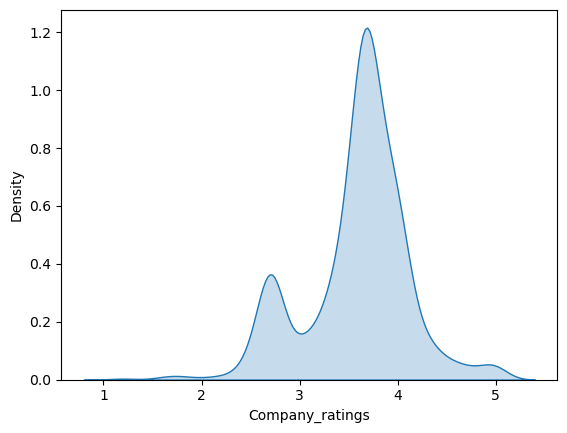

In [232]:
sns.kdeplot(x=df['Company_ratings'],fill=True)

In [246]:
title_count=df['Title'].value_counts().head(5)

<Axes: xlabel='Title'>

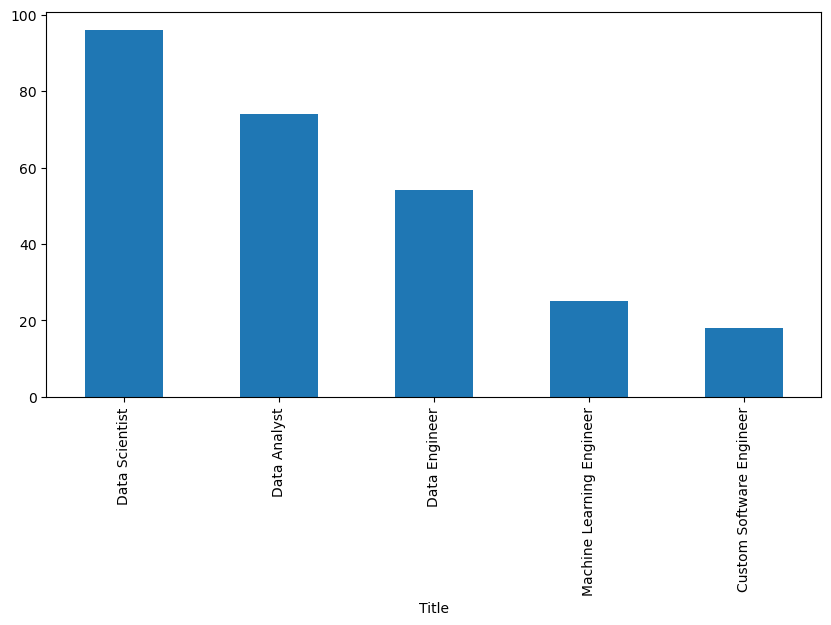

In [250]:
# most demanded role
title_count.plot(kind='bar', figsize=(10, 5))

In [265]:
Exp=df['Experience'].value_counts().head(4)

<Axes: xlabel='Experience'>

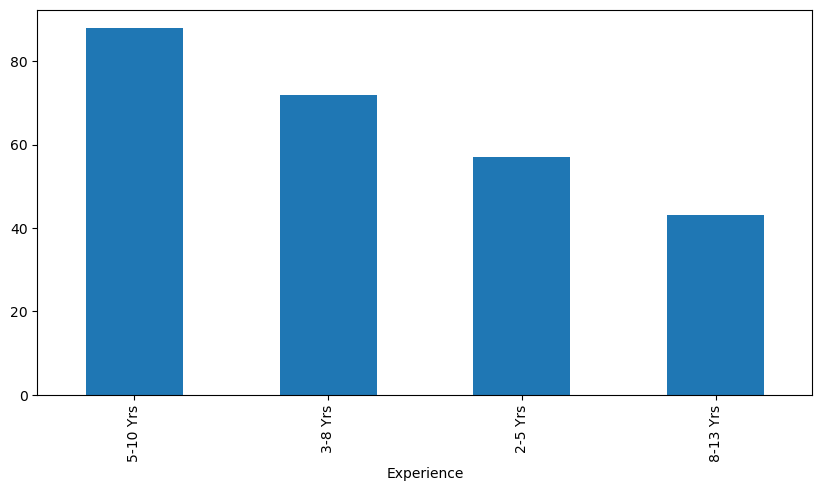

In [266]:
Exp.plot(kind='bar', figsize=(10, 5))

In [270]:
exp=df['Experience'].value_counts().head(5)

<Axes: ylabel='count'>

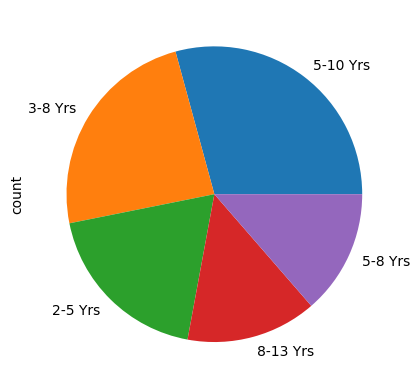

In [272]:
#experience required for the roles
exp.plot(kind='pie')

### Hypotheses
---
Null Hypothesis (H₀):
There is no significant difference in average company ratings across different experience groups.

Alternative Hypothesis (H₁):
At least one experience group has a significantly different average company rating.

In [279]:
from scipy.stats import f_oneway
anova_df = df.dropna(subset=["Experience", "Company_ratings"])

counts = anova_df["Experience"].value_counts()
valid_groups = counts[counts >= 5].index

anova_df = anova_df[anova_df["Experience"].isin(valid_groups)]

# Build ANOVA groups
groups = []
for exp in valid_groups:
    grp = anova_df[anova_df["Experience"] == exp]["Company_ratings"]
    groups.append(grp)

# Run ANOVA
f_stat, p_value = f_oneway(*groups)

print("F-statistic:", f_stat)
print("P-value:", p_value)

F-statistic: 1.1203684273126369
P-value: 0.2832212877342967


### Results

F-statistic: 1.2767

p-value: 0.1551

---

### Decision Rule

Significance level (α) = 0.05

If p-value < 0.05 → Reject H₀

If p-value ≥ 0.05 → Fail to reject H₀

Since:

p-value = 0.1551 > 0.05

We fail to reject the null hypothesis.

### Interpretation
---
The most in-demand roles are Data Scientist, Data Analyst, Data Engineer, and Machine Learning Engineer.

Hyderabad appears as the dominant job location, either alone or in hybrid/multi-city formats, indicating strong regional demand.

Most opportunities target mid-level professionals, especially in the 3–10 years experience range.

Salaries vary widely, with many roles offering packages between 5–30 Lacs per annum, showing strong earning potential in data-related careers.

Average company rating is around 3.6, giving students a benchmark for evaluating employers.

A large portion of jobs are recently posted, proving that the scraping system captures fresh and relevant opportunities.

### Conclusion
---
1. Job Role Trends

The most frequently occurring roles are:

Data Scientist – 96 jobs

Data Analyst – 74 jobs

Data Engineer – 55 jobs

Machine Learning Engineer – 30 jobs

AI / ML Engineer – 27 jobs

Custom Software Engineer – 27 jobs

This shows that data science and analytics–related roles dominate the job market in the scraped data.

---

2. Experience Demand

Most demanded experience ranges:

5–10 years – 109 jobs

3–8 years – 84 jobs

2–5 years – 77 jobs

5–8 years – 75 jobs

1–3 years – 38 jobs

Insight:

Majority of jobs target mid-level professionals (2–10 years).

Fewer roles are available for complete freshers.

---

. Salary Information

Salary data is available for only 123 jobs (many postings hide salary).

Available salaries range across wide bands such as 5–30 LPA, showing strong earning potential in data-related roles.

### Final Conclusion
Overall, this project proves that web scraping can be transformed into a practical job assistance system that:

Helps students and alumni discover relevant jobs faster

Improves placement outcomes for institutions

Provides market intelligence for curriculum planning

Enables data-driven career guidance